# News Summarizer_Part 2

In [51]:
import re
import string
import pandas as pd
import numpy as np
import tensorflow
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.util import ngrams
from textblob import TextBlob
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from sklearn.metrics.pairwise import cosine_similarity
from gensim import corpora, models, similarities, matutils
from gensim.summarization.summarizer import summarize
from sklearn.cluster import MiniBatchKMeans, SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.manifold import TSNE
from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from sumy.summarizers.lsa import LsaSummarizer
from sklearn.preprocessing import StandardScaler

plt.style.use('ggplot')
%matplotlib inline

In [3]:
names = np.arange(1,4)
articles = ['articles{}.csv'.format(name) for name in names]
source = pd.concat([pd.read_csv(article) for article in articles]).reset_index(drop=True)
source.drop(['Unnamed: 0', 'id', 'month', 'url'], axis=1, inplace=True)

In [6]:
print('Number of articles in the source: ' + str(len(source)))

Number of articles in the source: 142570


In [4]:
source.head()

,title,publication,author,date,year,content
0,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,WASHINGTON — Congressional Republicans have...
1,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,"After the bullet shells get counted, the blood..."
2,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,"When Walt Disney’s “Bambi” opened in 1942, cri..."
3,"Among Deaths in 2016, a Heavy Toll in Pop Musi...",New York Times,William McDonald,2017-04-10,2017.0,"Death may be the great equalizer, but it isn’t..."
4,Kim Jong-un Says North Korea Is Preparing to T...,New York Times,Choe Sang-Hun,2017-01-02,2017.0,"SEOUL, South Korea — North Korea’s leader, ..."


## Topic Modeling

In [4]:
news_content = source['content']

In [5]:
tfidf_vectorizer = TfidfVectorizer(analyzer='word', stop_words='english', min_df=0.05, max_features=900)
tfidf_data = tfidf_vectorizer.fit_transform(news_content)
terms = tfidf_vectorizer.get_feature_names()

### Reduce dimension

In [24]:
# NMF
nmf = NMF(n_components=50)
nmf_tfidf_data = nmf.fit_transform(tfidf_data)
for i in range(0,10):
    word_list=[]
    print("Topic%d:"% i)
    for j in nmf.components_.argsort()[i,-16:-1]:
        word_list.append(terms[j])
    print(word_list)

Topic0:
['long', 'star', 'great', 'day', 'way', 'just', 'best', 'man', 'love', 'story', 'book', 'years', 'time', 'world', 'like']
Topic1:
['post', 'great', 'presidency', 'nominee', 'supporters', 'america', 'speech', 'comments', 'business', 'media', 'administration', 'policy', 'election', 'republican', 'donald']
Topic2:
['sunday', 'going', 'interview', 'did', 'spokesman', 'cnn', 'asked', 'monday', 'thursday', 'tuesday', 'added', 'friday', 'statement', 'wednesday', 'told']
Topic3:
['speech', 'debate', 'husband', 'democrats', 'supporters', 'election', 'private', 'presidential', 'nominee', 'voters', 'campaign', 'secretary', 'email', 'democratic', 'hillary']
Topic4:
['agreed', 'year', 'group', 'firm', 'agreement', 'expected', 'reuters', 'editing', 'reporting', 'capital', 'buy', 'sources', 'market', 'wednesday', 'deal']
Topic5:
['judge', 'began', 'added', 'officials', 'years', 'times', 'campaign', 'chief', 'television', 'wrote', 'interview', 'senator', 'like', 'did', 'said']
Topic6:
['execut

In [25]:
# LSA
lsa = TruncatedSVD(n_components=50)
lsa_tfidf_data = lsa.fit_transform(tfidf_data)
for i in range(0,10):
    word_list=[]
    print("Topic%d:"% i)
    for j in lsa.components_.argsort()[i, -16:-1]:
        word_list.append(terms[j])
    print(word_list)

Topic0:
['percent', 'house', 'mr', 'campaign', 'time', 'obama', 'state', 'says', 'just', 'like', 'new', 'president', 'clinton', 'people', 'said']
Topic1:
['gop', 'candidate', 'party', 'nominee', 'republicans', 'voters', 'obama', 'presidential', 'election', 'hillary', 'president', 'republican', 'campaign', 'donald', 'clinton']
Topic2:
['going', 'things', 'good', 'life', 've', 'way', 'people', 'know', 'really', 'women', 'don', 'think', 'just', 'clinton', 'like']
Topic3:
['vote', 'democrats', 'candidate', 'election', 'party', 'department', 'presidential', 'voters', 'email', 'fbi', 'campaign', 'state', 'police', 'democratic', 'hillary']
Topic4:
['new', 'government', 'economy', 'states', 'health', 'bank', 'tax', 'china', 'growth', 'year', 'companies', 'market', 'million', 'company', 'billion']
Topic5:
['best', 'life', 'world', 'book', 'united', 'european', 'york', 'party', 'season', 'years', 'new', 'company', 'like', 'said', 'clinton']
Topic6:
['law', 'war', 'united', 'senate', 'military', 

## Clustering

In [ ]:
# Tried: KMeans, Mean Shift, AgglomerativeClustering

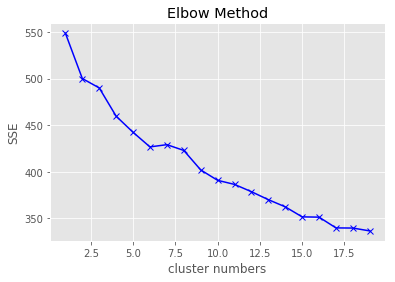

In [26]:
# Use Mini Batch KMeans on nmf_tfidf_data
SSE = []
k_clusters = range(1,20)
for k in k_clusters:
    kmeans = MiniBatchKMeans(n_clusters=k, batch_size= 300, random_state=1)
    kmeans.fit(nmf_tfidf_data)
    SSE.append(kmeans.inertia_)
    
plt.plot(k_clusters, SSE, 'bx-')
plt.title('Elbow Method')
plt.xlabel('cluster numbers')
plt.ylabel('SSE')
plt.show()

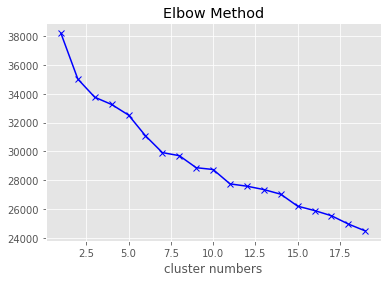

In [27]:
# Use Mini Batch KMeans on lsa_tfidf_data
SSE = []
k_clusters = range(1,20)
for k in k_clusters:
    kmeans = MiniBatchKMeans(n_clusters=k, batch_size=300, random_state=1)
    kmeans.fit(lsa_tfidf_data)
    SSE.append(kmeans.inertia_)
    
plt.plot(k_clusters, SSE, 'bx-')
plt.title('Elbow Method')
plt.xlabel('cluster numbers')
plt.show()

In [66]:
# find k
k = 4
kmeans = MiniBatchKMeans(n_clusters=k, batch_size=300, random_state=1)
kmeans.fit(lsa_tfidf_data)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['says', 'like', 'people', 'just', 'said', 'time', 'new', 'don', 'women', 'think', 'years', 'life', 'way', 'world', 'know']
cluster1:
['said', 'police', 'state', 'people', 'court', 'president', 'told', 'new', 'mr', 'news', 'government', 'obama', 'city', 'according', 'law']
cluster2:
['trump', 'clinton', 'said', 'president', 'donald', 'campaign', 'republican', 'obama', 'house', 'hillary', 'election', 'presidential', 'party', 'white', 'people']
cluster3:
['percent', 'company', 'said', 'billion', 'million', 'year', 'new', 'market', 'companies', 'bank', 'business', 'tax', 'health', 'growth', '000']


In [67]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==0]
for rev_index in indices_max[:5]:
    print(rev_index, str(source.content[rev_index]))
    print("\n")

3 Death may be the great equalizer, but it isn’t necessarily evenhanded. Of all the fields of endeavor that suffered mortal losses in 2016  —   consider Muhammad Ali and Arnold Palmer in sports and the      Hollywood deaths of Carrie Fisher and Debbie Reynolds  —   the pop music world had, hands down, the bleakest year. Start with David Bowie, whose stage persona  —   androgynous glam rocker, dance pop star, electronic experimentalist  —   was as   as his music. The year was only days old when the news came that he had died of cancer at 69. He had hinted that his time was short in the lyrics of his final album, released just two days before his death, but he had otherwise gone to great lengths to hide his illness from the public, a wish for privacy that ensured that his death would appear to have come out of the blue. Then came another shock, about three months later, when Prince accidentally overdosed on a painkiller and collapsed in an elevator at his sprawling home studio near Minne

### Visualize the dimension using tSNE

In [17]:
# DON'T TOUCH THIS CELL. IT TAKES FOREVER...
tsne = TSNE(n_components=2, verbose=1, perplexity=92, n_iter=300)
X_ne = tsne.fit_transform(lsa_tfidf_data)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 142570 samples in 0.528s...
[t-SNE] Computed neighbors for 142570 samples in 1807.904s...
[t-SNE] Computed conditional probabilities for sample 1000 / 142570
[t-SNE] Computed conditional probabilities for sample 2000 / 142570
[t-SNE] Computed conditional probabilities for sample 3000 / 142570
[t-SNE] Computed conditional probabilities for sample 4000 / 142570
[t-SNE] Computed conditional probabilities for sample 5000 / 142570
[t-SNE] Computed conditional probabilities for sample 6000 / 142570
[t-SNE] Computed conditional probabilities for sample 7000 / 142570
[t-SNE] Computed conditional probabilities for sample 8000 / 142570
[t-SNE] Computed conditional probabilities for sample 9000 / 142570
[t-SNE] Computed conditional probabilities for sample 10000 / 142570
[t-SNE] Computed conditional probabilities for sample 11000 / 142570
[t-SNE] Computed conditional probabilities for sample 12000 / 142570
[t-SNE] Computed conditional pro

[t-SNE] Computed conditional probabilities for sample 123000 / 142570
[t-SNE] Computed conditional probabilities for sample 124000 / 142570
[t-SNE] Computed conditional probabilities for sample 125000 / 142570
[t-SNE] Computed conditional probabilities for sample 126000 / 142570
[t-SNE] Computed conditional probabilities for sample 127000 / 142570
[t-SNE] Computed conditional probabilities for sample 128000 / 142570
[t-SNE] Computed conditional probabilities for sample 129000 / 142570
[t-SNE] Computed conditional probabilities for sample 130000 / 142570
[t-SNE] Computed conditional probabilities for sample 131000 / 142570
[t-SNE] Computed conditional probabilities for sample 132000 / 142570
[t-SNE] Computed conditional probabilities for sample 133000 / 142570
[t-SNE] Computed conditional probabilities for sample 134000 / 142570
[t-SNE] Computed conditional probabilities for sample 135000 / 142570
[t-SNE] Computed conditional probabilities for sample 136000 / 142570
[t-SNE] Computed con

In [17]:
# DON'T TOUCH THIS CELL. IT TAKES FOREVER...
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=300)
X_ne = tsne.fit_transform(lsa_tfidf_data)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 142570 samples in 0.528s...
[t-SNE] Computed neighbors for 142570 samples in 1807.904s...
[t-SNE] Computed conditional probabilities for sample 1000 / 142570
[t-SNE] Computed conditional probabilities for sample 2000 / 142570
[t-SNE] Computed conditional probabilities for sample 3000 / 142570
[t-SNE] Computed conditional probabilities for sample 4000 / 142570
[t-SNE] Computed conditional probabilities for sample 5000 / 142570
[t-SNE] Computed conditional probabilities for sample 6000 / 142570
[t-SNE] Computed conditional probabilities for sample 7000 / 142570
[t-SNE] Computed conditional probabilities for sample 8000 / 142570
[t-SNE] Computed conditional probabilities for sample 9000 / 142570
[t-SNE] Computed conditional probabilities for sample 10000 / 142570
[t-SNE] Computed conditional probabilities for sample 11000 / 142570
[t-SNE] Computed conditional probabilities for sample 12000 / 142570
[t-SNE] Computed conditional pro

[t-SNE] Computed conditional probabilities for sample 123000 / 142570
[t-SNE] Computed conditional probabilities for sample 124000 / 142570
[t-SNE] Computed conditional probabilities for sample 125000 / 142570
[t-SNE] Computed conditional probabilities for sample 126000 / 142570
[t-SNE] Computed conditional probabilities for sample 127000 / 142570
[t-SNE] Computed conditional probabilities for sample 128000 / 142570
[t-SNE] Computed conditional probabilities for sample 129000 / 142570
[t-SNE] Computed conditional probabilities for sample 130000 / 142570
[t-SNE] Computed conditional probabilities for sample 131000 / 142570
[t-SNE] Computed conditional probabilities for sample 132000 / 142570
[t-SNE] Computed conditional probabilities for sample 133000 / 142570
[t-SNE] Computed conditional probabilities for sample 134000 / 142570
[t-SNE] Computed conditional probabilities for sample 135000 / 142570
[t-SNE] Computed conditional probabilities for sample 136000 / 142570
[t-SNE] Computed con

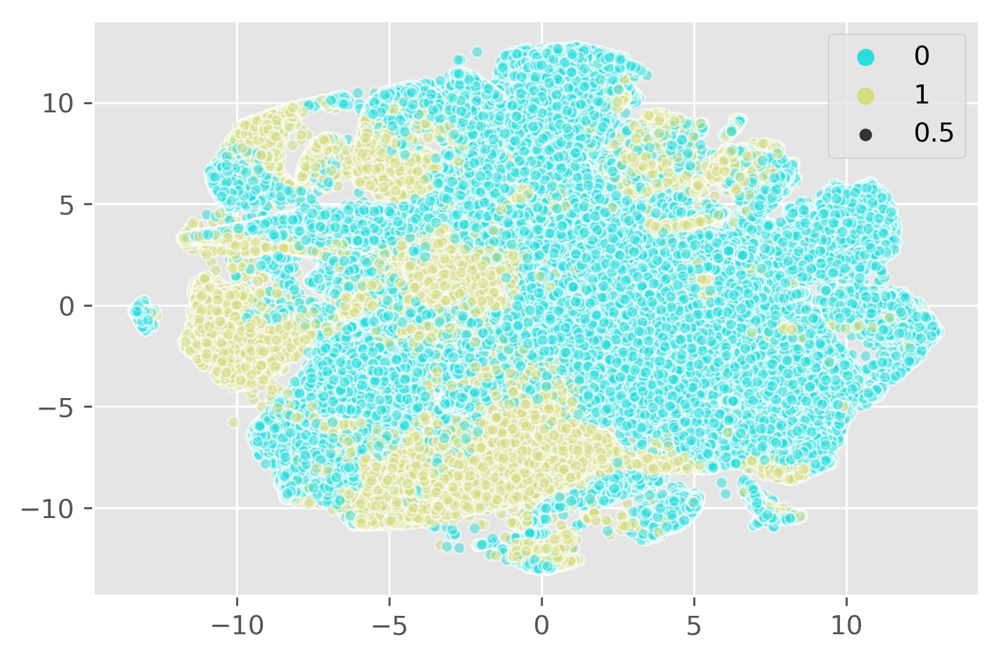

In [23]:
# 2
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

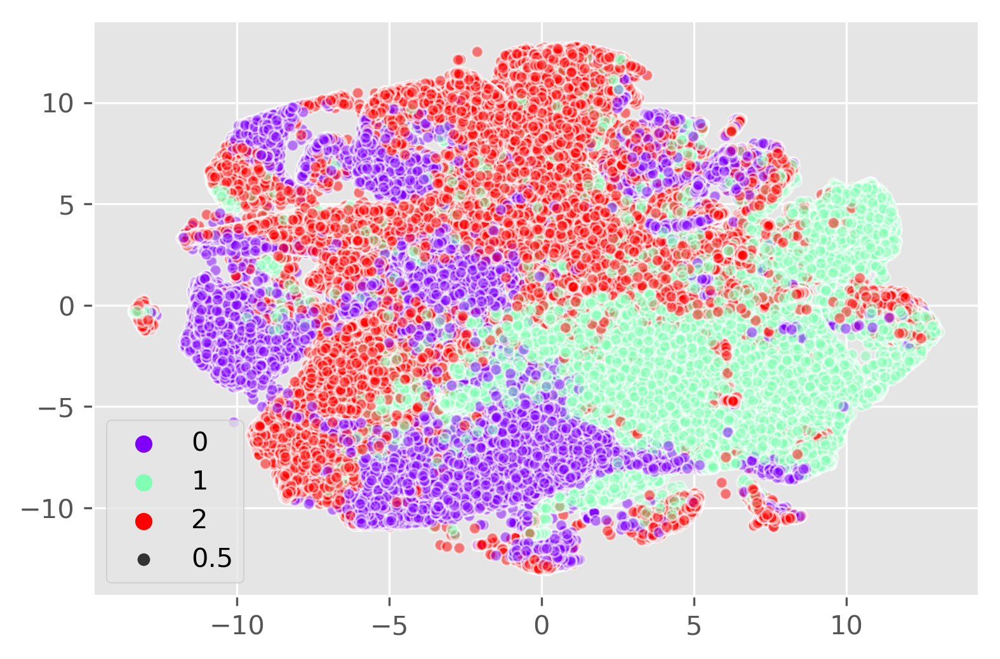

In [29]:
# 3
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

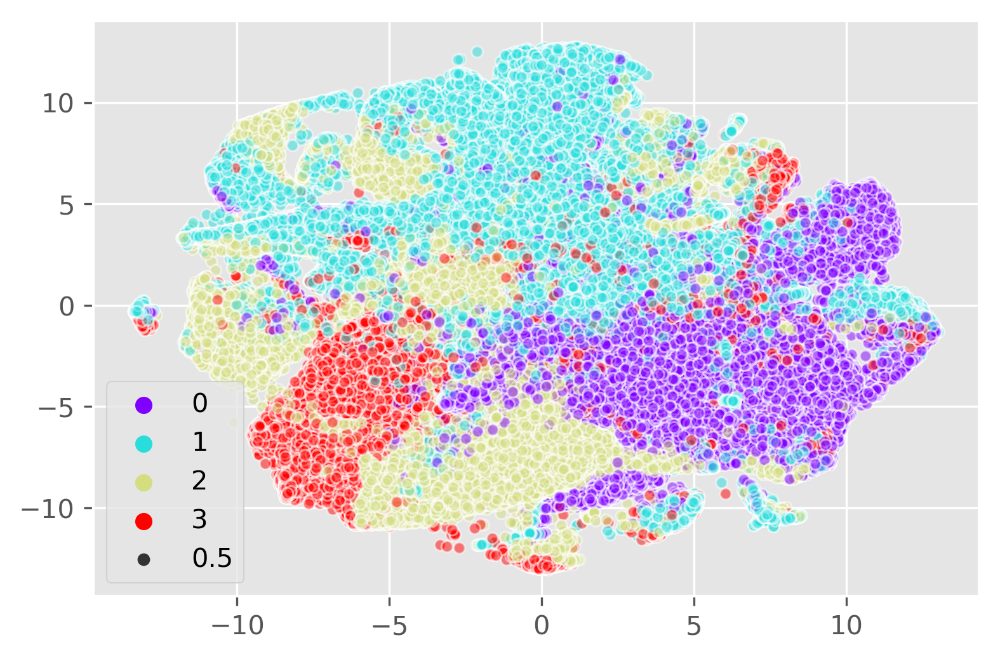

In [41]:
# 4
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

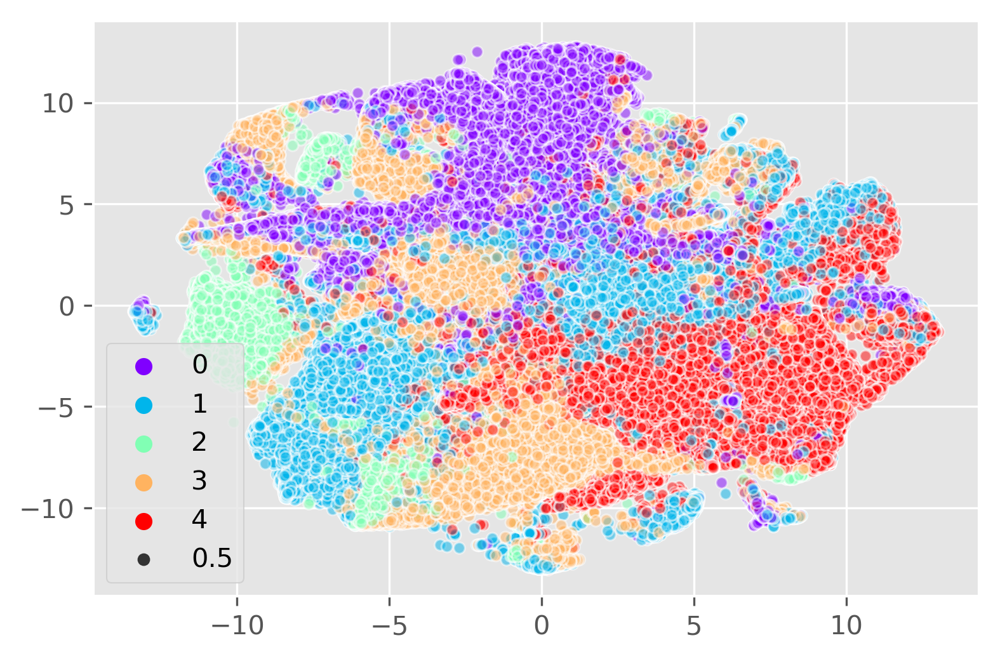

In [43]:
# 5
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

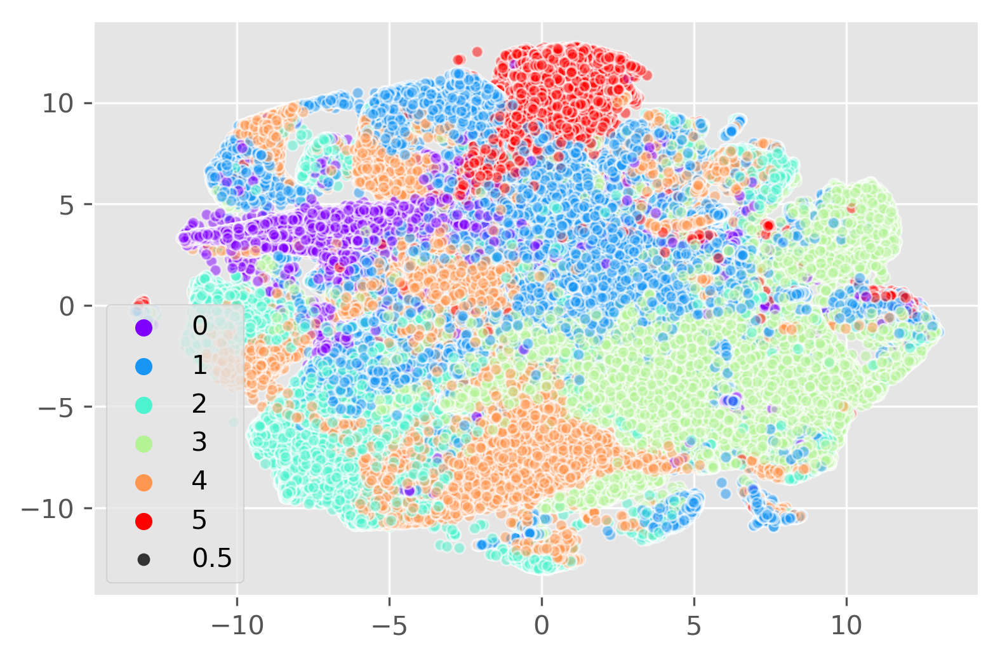

In [32]:
# 6
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

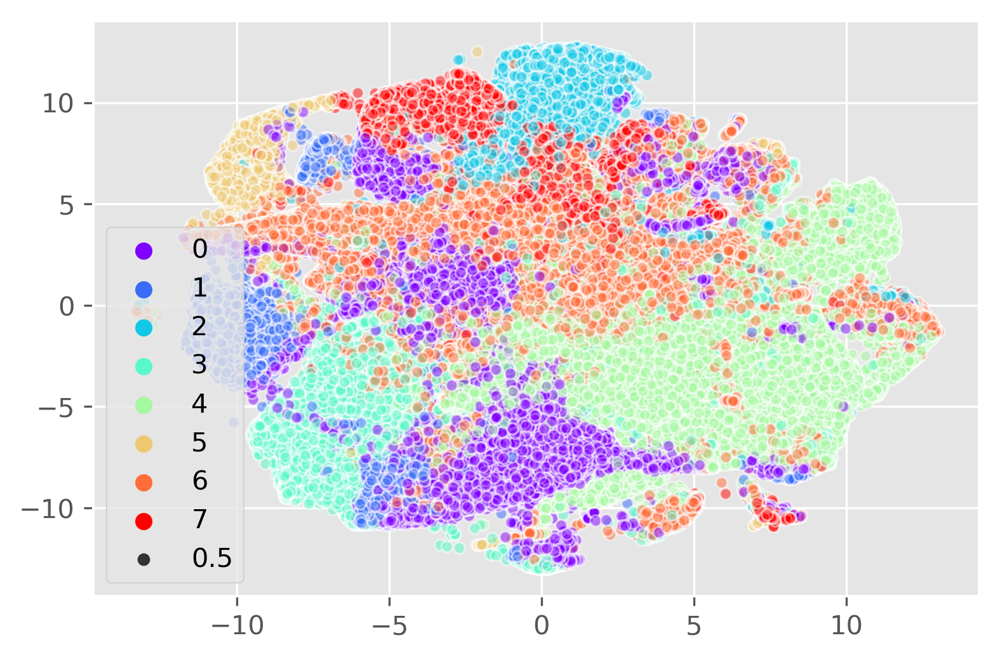

In [18]:
# 8
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

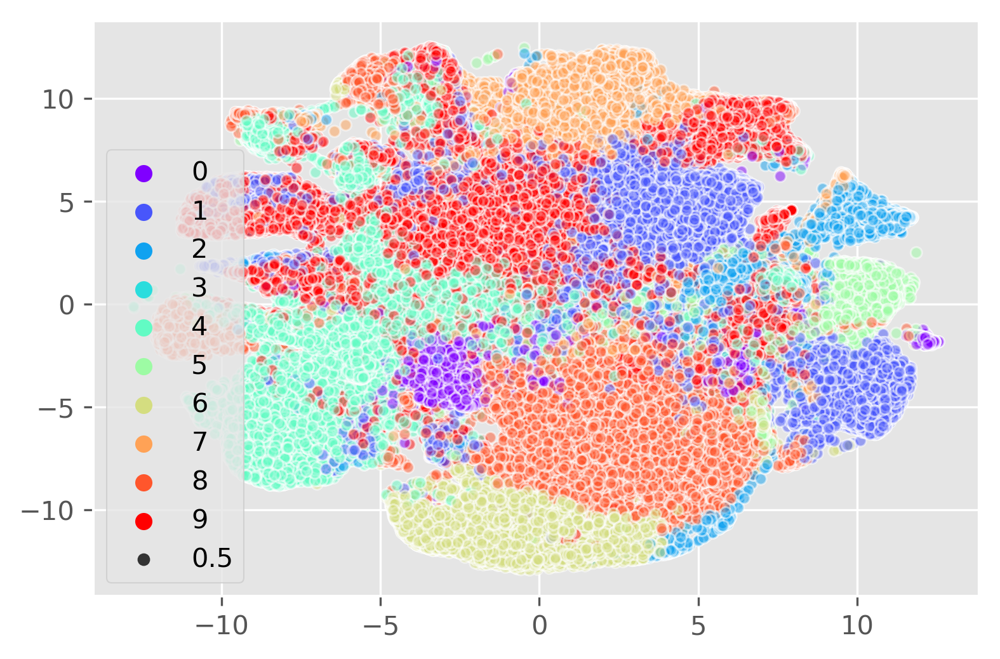

In [25]:
# 10
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

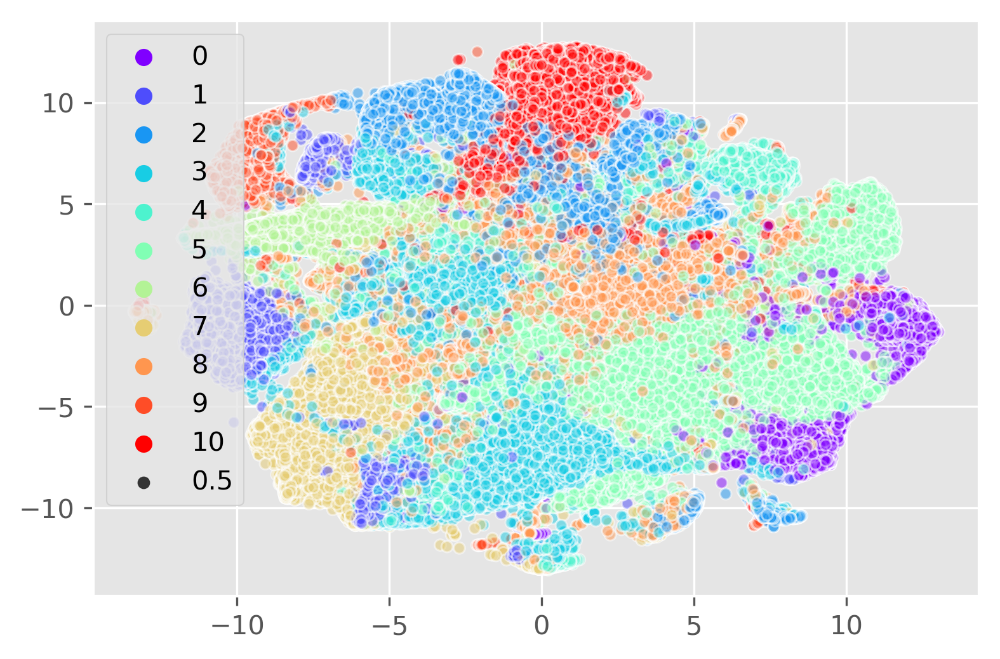

In [39]:
# 11
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

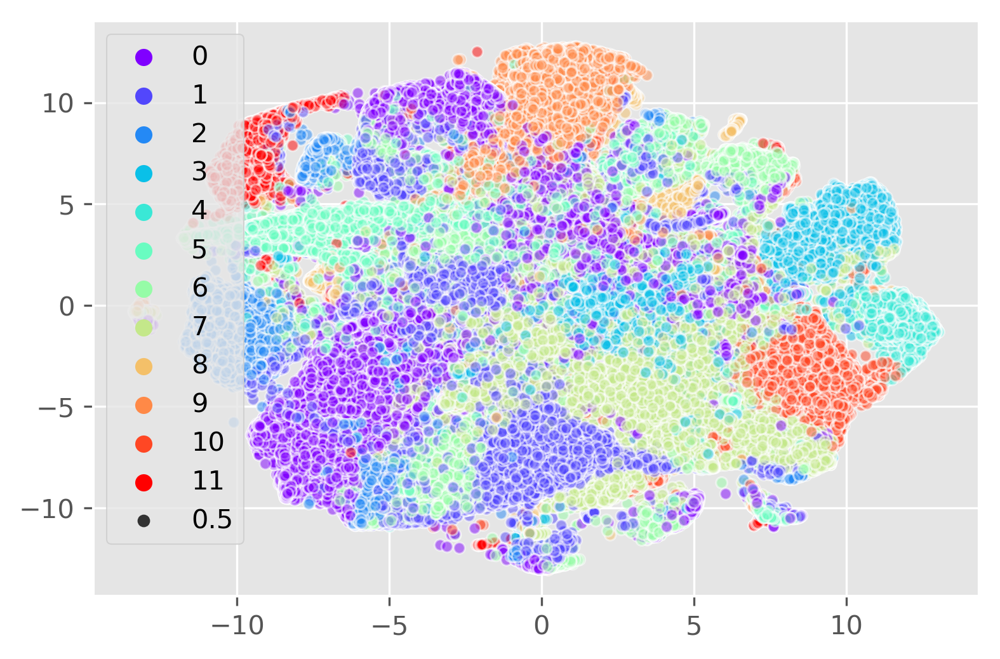

In [47]:
# 12
figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_, alpha=0.5, size = 0.5, palette='rainbow', legend='full');

## Text Summarizer

### Cosine similarity

In [73]:
news_content_withpunc = source['content']
news_content_withpunc = [text.lower() for text in news_content_withpunc]
news_content_withpunc = [re.sub( '\s+', ' ', text).strip() for text in news_content_withpunc]

In [80]:
sentences = sent_tokenize(news_content_withpunc[0])

In [81]:
count_vectorizer = CountVectorizer(analyzer='word', stop_words='english')
count_data = count_vectorizer.fit_transform(sentences)
entire_data = count_vectorizer.transform([news_content_withpunc[0]])
count_data.shape

(26, 298)

In [82]:
df = pd.DataFrame(count_data.todense(), columns=count_vectorizer.get_feature_names())
df.head()

,13,20,2010,2015,2017,access,acknowledge,act,administration,advocates,...,violation,voters,want,washington,white,widespread,win,won,worried,years
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [83]:
print('Title of the article: ' + source['title'][0])
print('Content: ' + source['content'][0])

Title of the article: House Republicans Fret About Winning Their Health Care Suit - The New York Times
Content: WASHINGTON  —   Congressional Republicans have a new fear when it comes to their    health care lawsuit against the Obama administration: They might win. The incoming Trump administration could choose to no longer defend the executive branch against the suit, which challenges the administration’s authority to spend billions of dollars on health insurance subsidies for   and   Americans, handing House Republicans a big victory on    issues. But a sudden loss of the disputed subsidies could conceivably cause the health care program to implode, leaving millions of people without access to health insurance before Republicans have prepared a replacement. That could lead to chaos in the insurance market and spur a political backlash just as Republicans gain full control of the government. To stave off that outcome, Republicans could find themselves in the awkward position of approp

In [84]:
summary = np.array([cosine_similarity(vec1, entire_data) for vec1 in count_data]).reshape(-1,)

In [85]:
sorted_sentences = [sentences[i] for i in np.argsort(summary)[::-1]]
for text in sorted_sentences[:2]:
    print(text)

” in a potentially decision in 2015, judge rosemary m. collyer ruled that house republicans had the standing to sue the executive branch over a spending dispute and that the obama administration had been distributing the health insurance subsidies, in violation of the constitution, without approval from congress.
anticipating that the trump administration might not be inclined to mount a vigorous fight against the house republicans given the ’s dim view of the health care law, a team of lawyers this month sought to intervene in the case on behalf of two participants in the health care program.


### Lsa Summarizer from sumy

In [86]:
txt = source['content'][0]
txt = txt.lower()
txt = re.sub( '\s+', ' ', txt).strip()

In [87]:
parser = PlaintextParser.from_string(txt, Tokenizer('english'))

In [88]:
summarizer_2 = LsaSummarizer()
summary_2 = summarizer_2(parser.document,2) # in 2 sentences
sentences
for sentence in summary_2:
    print(sentence)

washington — congressional republicans have a new fear when it comes to their health care lawsuit against the obama administration: they might win.
but on spending power and standing, the trump administration may come under pressure from advocates of presidential authority to fight the house no matter their shared views on health care, since those precedents could have broad repercussions.


### Summarizer from gensim

In [91]:
print(summarize(txt, ratio=0.09))

the incoming trump administration could choose to no longer defend the executive branch against the suit, which challenges the administration’s authority to spend billions of dollars on health insurance subsidies for and americans, handing house republicans a big victory on issues.
collyer ruled that house republicans had the standing to sue the executive branch over a spending dispute and that the obama administration had been distributing the health insurance subsidies, in violation of the constitution, without approval from congress.
